# Introduction

By: Vijay Panchal (7225949) & Karan Arora (6226120)

This projects showcases **Deep Learning** through the use of **Convulutional Neural Network (CNNs)** by models that can distinguish between Cats and Dogs. We start by making our own simple CNN model. We then fine tune that model and produce a more accurate model. To further improve our model, we utilize **Transfer Learning** by using a pretrained model and fine tune that model as well. Overall, we can grasp the benefits of utilizing techniques like **Deep Leaning** and **Transfer Learning** to optimize models.


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os
import tensorflow as tf
from tensorflow.keras.optimizers import Adam

In [ ]:
!pip install opendatasets

In [ ]:
import opendatasets as od
import kagglehub

od.download("https://www.kaggle.com/datasets/shaunthesheep/microsoft-catsvsdogs-dataset",force=True)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: vijaypanchal101
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/shaunthesheep/microsoft-catsvsdogs-dataset


100%|██████████| 788M/788M [00:05<00:00, 163MB/s]


# Data Preprocessing

## Step 1: Removing Invalid Files

1. Ignore other directories
2. Only allow files with .jpg extension
3. Remove Corrupted Files using the verify()



In [ ]:
import os
from PIL import Image

base_path = '/content/microsoft-catsvsdogs-dataset/PetImages'

# Running it locally
# base_path = 'C:\\Users\\vp464\\Downloads\\PetImages'

folders = ['Cat', 'Dog']
for folder in folders:
    folder_path = os.path.join(base_path, folder)

    for filename in os.listdir(folder_path):
        file_path = os.path.join(folder_path, filename)

        # If it's a directory (e.g., hidden system folder), skip it
        if os.path.isdir(file_path):
            continue

        # Check if the file ends with .jpg
        if not filename.lower().endswith('.jpg'):
            print(f"Removing non-JPG file: {file_path}")
            os.remove(file_path)  # remove it from the dataset
        else:
            try:
                Image.open(file_path).verify()
            except:
                print(f"Removing corrupted file: {file_path}")
                os.remove(file_path)
            pass

print("Cleanup complete. Only .jpg files should remain in each folder.")


/usr/local/lib/python3.11/dist-packages/PIL/TiffImagePlugin.py:949: UserWarning: Truncated File Read
  warnings.warn(str(msg))


Cleanup complete. Only .jpg files should remain in each folder.


## Step 2: Load in Images, Resize, and return NP Array of Size and Colour and an NP Array of the Labels

1. Loading in Images
  - Makes a list of images and labels
  - Does an extra constraint which makes sure we Load in images (only .jpg)
2. Resize
  - We resized all the images to 150 in height and width
  - Return an NP array of the RGB values of each image and another NP array of the classification of the image (0 (cat) or 1 (dog))

In [ ]:
import os
import numpy as np

def load_images_from_directory(base_dir, image_size=(224, 224)):
    images = []
    labels = []
    label_map = {'Cat': 0, 'Dog': 1}

    for folder_name in os.listdir(base_dir):
        folder_path = os.path.join(base_dir, folder_name)
        if os.path.isdir(folder_path) and folder_name in label_map:
            label = label_map[folder_name]
            for filename in os.listdir(folder_path):
                file_path = os.path.join(folder_path, filename)

                # Skip if not an image
                if not filename.lower().endswith(('.jpg')):
                    continue

                try:
                    with Image.open(file_path) as img:
                        # Convert all images to RGB
                        img = img.convert('RGB')
                        img = img.resize(image_size)
                        img_array = np.array(img)

                    images.append(img_array)
                    labels.append(label)

                except Exception as e:
                    print(f"Skipping file {file_path}: {e}")

    return np.array(images), np.array(labels)


## Load in images and Normalize them

In [ ]:
directory = base_path
X, y = load_images_from_directory(directory)

X = X.astype('float32') / 255.0

print(X.shape)
print(y.shape)

## Step 3: Splitting Data into Training, Validation, and Testing

We split the data into 3 sections. The training section which is 80% of the data which is then further split into training data (80%) and validation data (20%). This means that our training data size is 16,000 images, validation size is 4,000 images. Our testing data size is 5,000 images.


In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                  test_size=0.2,
                                                  random_state=42)

X_train1, X_val, y_train1, y_val = train_test_split(X_train, y_train,
                                                  test_size=0.2,
                                                  random_state=42)

print("Train set shape:", X_train1.shape, y_train1.shape)
print("Validation set shape:", X_val.shape, y_val.shape)
print("Test set shape:", X_test.shape, y_test.shape)


Train set shape: (15998, 224, 224, 3) (15998,)
Validation set shape: (4000, 224, 224, 3) (4000,)
Test set shape: (5000, 224, 224, 3) (5000,)


# Testing Our Models

## Our Model

### Building and Testing our Model

1. Using multiple convulutional layers and

3. Flatten: Converts the 2D feature maps into a 1D vector.

4. Dense: Fully connected layer for classification.

5. Dropout: Randomly “turns off” neurons to reduce overfitting.


We test our model on the validation dataset, and we noticed that for our last epoch we got an accuracy of 85%, with a loss of ~0.94.

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras import layers
#creating our CNN model for Cat's vs Dog's
model = tf.keras.models.Sequential([
    # convulutional layer with 32 filters, each 3x3px. The inputing image with be 224x224 with 3 colour channels (RBG)
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)),
    #Maxpooling layer has a stride of 2x2px taking the max values of the conv layer we just created. It reduced the dimentaions of the image by a factor of 2.
    layers.MaxPooling2D(2, 2),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D(2, 2),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D(2, 2),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D(2, 2),
    # Flattening the Convultional layers before passing them to the Dense layers.
    Flatten(),
    # Dense layer with 512 Neurons.
    Dense(512, activation='relu'),
    #Drop rate of 50%
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])
# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 52, 52, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 26, 26, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 24, 24, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 12, 12, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 9216)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │       4,719,104 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │             513 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,812,865 (18.36 MB)

 Trainable params: 4,812,865 (18.36 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
#training our dataset along with the validation set.
history = model.fit(
    X_train1, y_train1,
    validation_data=(X_val, y_val),
    epochs=20,
    batch_size=32
)

Epoch 1/20
500/500 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - accuracy: 0.5360 - loss: 0.6909 - val_accuracy: 0.6680 - val_loss: 0.6104
Epoch 2/20
500/500 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.6677 - loss: 0.6104 - val_accuracy: 0.7312 - val_loss: 0.5447
Epoch 3/20
500/500 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.7494 - loss: 0.5119 - val_accuracy: 0.7753 - val_loss: 0.4648
Epoch 4/20
500/500 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.8087 - loss: 0.4200 - val_accuracy: 0.8183 - val_loss: 0.3992
Epoch 5/20
500/500 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.8374 - loss: 0.3669 - val_accuracy: 0.8130 - val_loss: 0.4107
Epoch 6/20
500/500 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.8648 - loss: 0.3097 - val_accuracy: 0.8170 - val_loss: 0.4107
Epoch 7/20
500/500 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9044 - loss: 0.2302 - val_accuracy: 0.8480 - val_loss: 0.3469
Epoch 8/20
500/500 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9320 - loss: 0.1674 - val_acc

### Graph of the Accuracy and Loss

Looking at the graph, there irregularities that occur, in our case it's the overfitting that occurs in the validation loss.

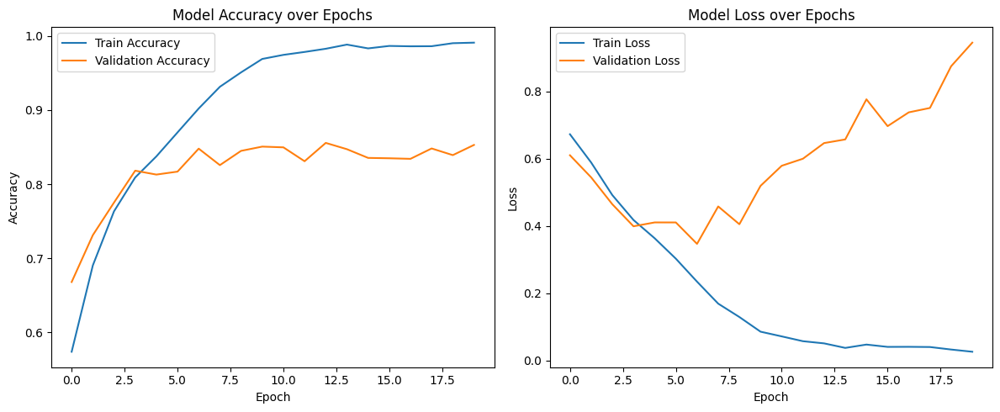

In [ ]:
import matplotlib.pyplot as plt

# Plot Training and Validation Accuracy
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='upper left')

# Plot Training and Validation Loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper left')

plt.tight_layout()
plt.show()


### Testing our Data

The result of testing our data we ended up with a 85% accuracy rate and 0.8309 loss rate.

In [ ]:
#Testing our model on the testing data.

loss, accuracy = model.evaluate(X_test, y_test)

print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")

157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.8495 - loss: 0.8549
Test Loss: 0.8309
Test Accuracy: 0.8546


In [ ]:
predictions = model.predict(X_test)  # This returns probabilities
predicted_labels = (predictions > 0.5).astype("int32")  # Convert probabilities to 0 or 1


157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step


157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step


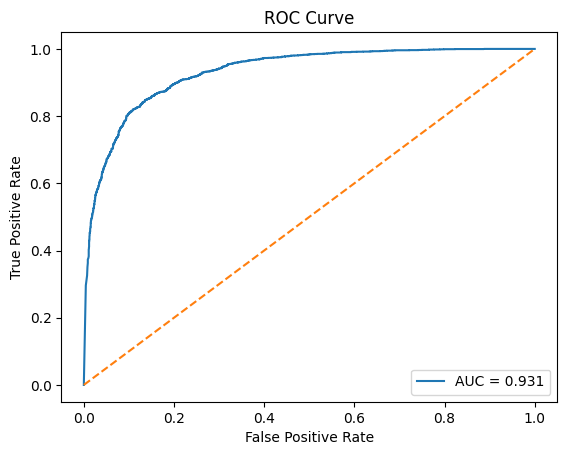

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# plotting our results on a ROC Curve

y_prob = model.predict(X_test).ravel()

fpr, tpr, _ = roc_curve(y_test, y_prob)

roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, label=f'AUC = {roc_auc:.3f}')
plt.plot([0, 1], [0, 1], linestyle='--')
plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
plt.show()

### Confusion Matrix

This compares the actual classes with the predicted classes using the testing data. From this matrix we can see that the tests reulsted in 2132 true positive for cats, 2141 true positives for dogs, 353 false positive for cat and 374 false positive for dogs. Overall this showcases that our model predicted a good portion of the tests correctly.We can also utilze the metrics from the CM to calculate the classification Metrics.

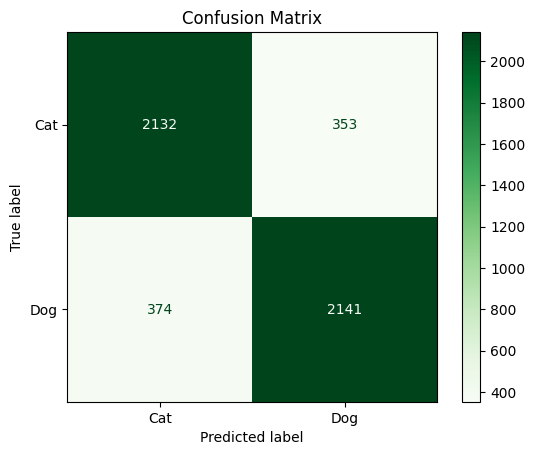

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

#Creating the Confusion Matrix
cm = confusion_matrix(y_test, predicted_labels)

# Create the display object
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Cat", "Dog"])

# Plot the confusion matrix
disp.plot(cmap=plt.cm.Greens)
plt.title("Confusion Matrix")
plt.show()


### Classification Report

What we are measuring:

**Accuracy:** measures the percentage of correct predictions out of the total.

**Precision:** evaluates how many of the predicted positive classes were actually correct.

**Recall:** assesses how many of the actual positive classes were correctly identified.

**F1-Score:** combines precision and recall into a single metric for balanced evaluation.

How to calculate the metrics

**Accuracy:** ((True positive + true negative) / (true positive + true negative + false positive + false negative))

**Precision:** truePositive / (truePositive + falsePositive)

**Recall:** truePositive / (truePositive + falseNegative)

**F1 Score:** 2 * (precision * recall) / (precision + recall)



**Result:**
We can see from our first model that our metrics for all Metrics are ~85%. Our model can fairly predict

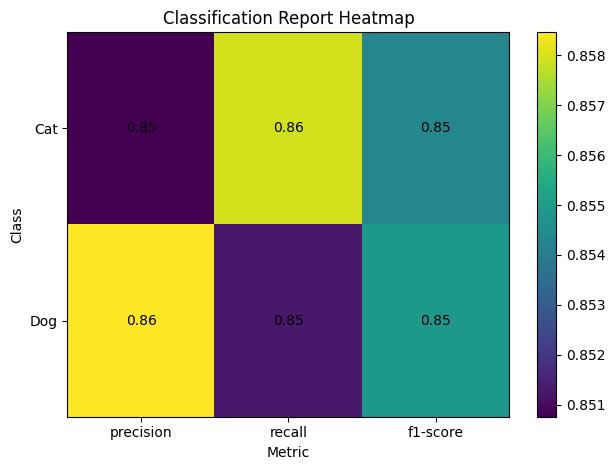

In [ ]:
from sklearn.metrics import classification_report
import pandas as pd
import matplotlib.pyplot as plt

# Build report DataFrame
report = classification_report(y_test, predicted_labels,
                               target_names=['Cat','Dog'],
                               output_dict=True)
df = pd.DataFrame(report).transpose()[['precision','recall','f1-score']].loc[['Cat','Dog']]

# Plot heatmap
fig, ax = plt.subplots()
im = ax.imshow(df.values, aspect='auto')            # default colormap

# Label axes
ax.set_xticks(range(len(df.columns)))
ax.set_xticklabels(df.columns)
ax.set_yticks(range(len(df.index)))
ax.set_yticklabels(df.index)

# Annotate each cell with its value
for i in range(df.shape[0]):
    for j in range(df.shape[1]):
        ax.text(j, i, f"{df.iloc[i, j]:.2f}",
                ha='center', va='center')

# Add colorbar and title
fig.colorbar(im, ax=ax)
plt.title("Classification Report Heatmap")
plt.xlabel("Metric")
plt.ylabel("Class")
plt.tight_layout()
plt.show()


### Testing the Model from a Sample of the Testing Data

We were able to get 13/15 correct which accuratly displays our model's accuracy which is around ~86%. If our model were to get some outliers, it would def hinder the accuracy as overfitting is an issue we having.

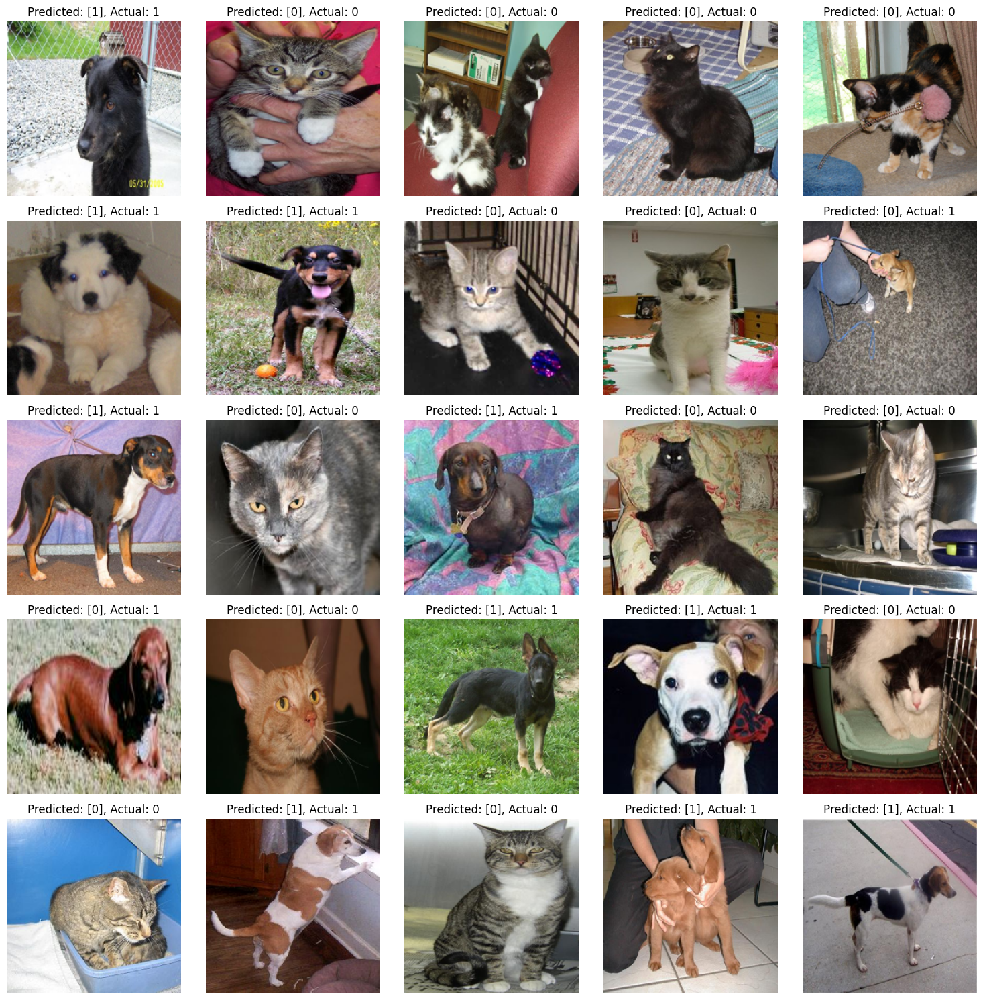

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Randomly pick 25 indices from X_test
random_indices = np.random.choice(len(X_test), 25, replace=False)

# Create a figure that's large enough for 25 subplots
plt.figure(figsize=(15, 15))

for i, idx in enumerate(random_indices):
    plt.subplot(5, 5, i + 1)  # 5 rows, 5 columns
    # 'Denormalize' if X_test is in [0,1]
    img_display = (X_test[idx] * 255).astype('uint8')
    plt.imshow(img_display)
    plt.title(f"Predicted: {predicted_labels[idx]}, Actual: {y_test[idx]}")
    plt.axis('off')

plt.tight_layout()
plt.show()


## Our Improved Model

### Building and Testing

In this model we added **Data Augmentation** which in our case we flipped data around to grasp more variety of possible solutions adhering to edge cases that occur. We also added another **dropout layer** as our model previously was overfitting. Utilizing both these new changes should lead to a more leveled out graph meaning that the overfitting has been reduced drastically.

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras import layers
#creating our CNN model for Cat's vs Dog's
model = tf.keras.models.Sequential([
    # convulutional layer with 32 filters, each 3x3px. The inputing image with be 224x224 with 3 colour channels (RBG)
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)),
    #Maxpooling layer has a stride of 2x2px taking the max values of the conv layer we just created. It reduced the dimentaions of the image by a factor of 2.
    layers.MaxPooling2D(2, 2),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D(2, 2),
    layers.Conv2D(64, (3, 3), activation='relu'),
    Dropout(0.5),
    layers.MaxPooling2D(2, 2),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D(2, 2),
    # Flattening the Convultional layers before passing them to the Dense layers.
    Flatten(),
    # Dense layer with 512 Neurons.
    Dense(512, activation='relu'),
    #Drop out rate of 50%
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])
#Compile the model with the adam optimizer.
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 52, 52, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 52, 52, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 26, 26, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 24, 24, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 12, 12, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 9216)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │       4,719,104 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │             513 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,812,865 (18.36 MB)

 Trainable params: 4,812,865 (18.36 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
# data augmenting on the images.
datagen = ImageDataGenerator(
    rotation_range=5,
    width_shift_range=0.05,
    height_shift_range=0.05,
    horizontal_flip=True,
    zoom_range=0.05
)


In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

early_stop = EarlyStopping(monitor='val_loss',patience=15,restore_best_weights=True)
#Train the dataset wiht the training set along with testing on the validation dataset.
history = model.fit(
    datagen.flow(X_train1, y_train1, batch_size=32),
    validation_data=(X_val, y_val),
    epochs=20,
    callbacks=[early_stop]
)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/20
500/500 ━━━━━━━━━━━━━━━━━━━━ 162s 311ms/step - accuracy: 0.5375 - loss: 0.6891 - val_accuracy: 0.6150 - val_loss: 0.6520
Epoch 2/20
500/500 ━━━━━━━━━━━━━━━━━━━━ 148s 296ms/step - accuracy: 0.6387 - loss: 0.6379 - val_accuracy: 0.6720 - val_loss: 0.6128
Epoch 3/20
500/500 ━━━━━━━━━━━━━━━━━━━━ 148s 295ms/step - accuracy: 0.7028 - loss: 0.5749 - val_accuracy: 0.7412 - val_loss: 0.5326
Epoch 4/20
500/500 ━━━━━━━━━━━━━━━━━━━━ 149s 297ms/step - accuracy: 0.7414 - loss: 0.5200 - val_accuracy: 0.7467 - val_loss: 0.5079
Epoch 5/20
500/500 ━━━━━━━━━━━━━━━━━━━━ 149s 297ms/step - accuracy: 0.7769 - loss: 0.4752 - val_accuracy: 0.7555 - val_loss: 0.5021
Epoch 6/20
500/500 ━━━━━━━━━━━━━━━━━━━━ 149s 297ms/step - accuracy: 0.7964 - loss: 0.4398 - val_accuracy: 0.8110 - val_loss: 0.4396
Epoch 7/20
500/500 ━━━━━━━━━━━━━━━━━━━━ 148s 296ms/step - accuracy: 0.8127 - loss: 0.4174 - val_accuracy: 0.8207 - val_loss: 0.4107
Epoch 8/20
500/500 ━━━━━━━━━━━━━━━━━━━━ 148s 297ms/step - accuracy: 0.8232 -

### Graph of the Accuracy and Loss

The overfitting issue that occured in our previous model has been reduced significantly as we can see via the graph below. The graph is leveled out more evenly. and showcases no overfitting. The training accuracy and loss are around the same as the validation accuracy and loss.

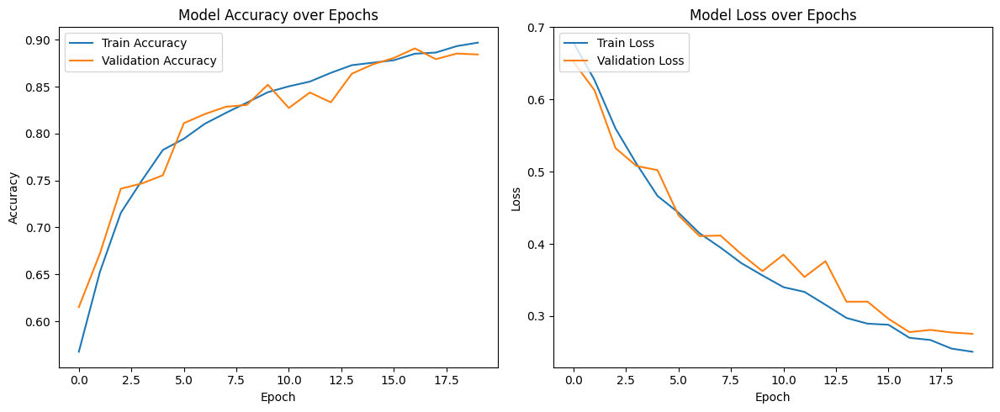

In [ ]:
import matplotlib.pyplot as plt


# Plot Training and Validation Accuracy
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='upper left')

# Plot Training and Validation Loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper left')

plt.tight_layout()
plt.show()


### Testing Results

The results of running the tes we were able to see that we got an accuracy of ~89% and loss of 0.2723. These metrics are better than our first model showing improvement.

In [ ]:
#Testing the model
loss, accuracy = model.evaluate(X_test, y_test)

print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")

157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.8907 - loss: 0.2752
Test Loss: 0.2723
Test Accuracy: 0.8892


In [ ]:
predictions = model.predict(X_test)  # This returns probabilities
predicted_labels = (predictions > 0.5).astype("int32")  # Convert probabilities to 0 or 1


157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step


### ROC

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step


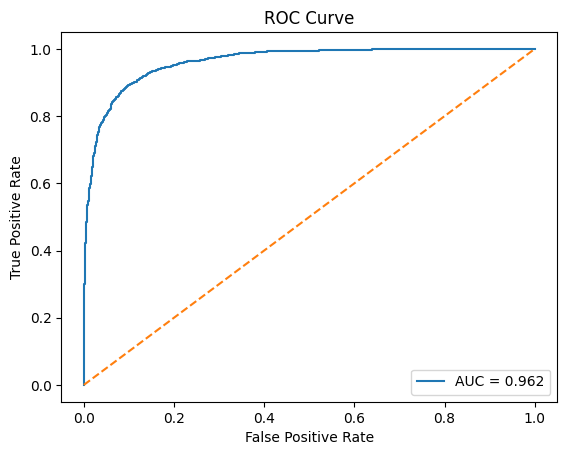

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

#Plotting the ROC Curve

y_prob = model.predict(X_test).ravel()

fpr, tpr, _ = roc_curve(y_test, y_prob)

roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, label=f'AUC = {roc_auc:.3f}')
plt.plot([0, 1], [0, 1], linestyle='--')
plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
plt.show()

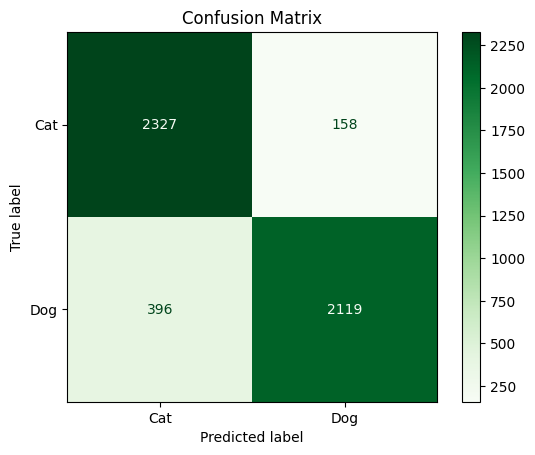

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

#Create the confusion Matrix
cm = confusion_matrix(y_test, predicted_labels)

# Create the display object
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Cat", "Dog"])

# Plot the confusion matrix
disp.plot(cmap=plt.cm.Greens)
plt.title("Confusion Matrix")
plt.show()

### Classification Report

We can see from that our first model metrics for all metrics are ~85%. Our second model showcased a bigger imporvements, which is showcased on the classification heatmap chart below.

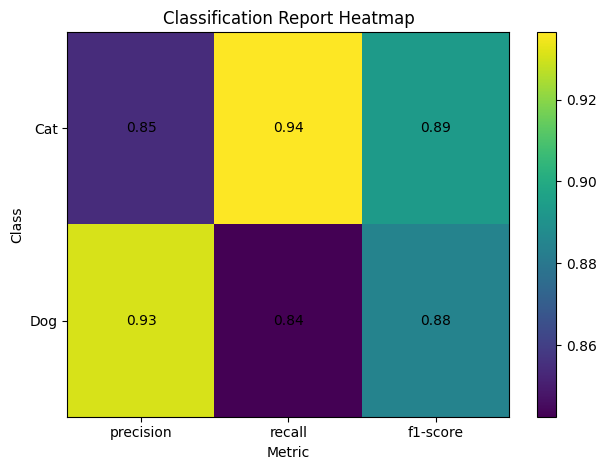

In [ ]:
from sklearn.metrics import classification_report
import pandas as pd
import matplotlib.pyplot as plt

report = classification_report(y_test, predicted_labels,
                               target_names=['Cat','Dog'],
                               output_dict=True)
df = pd.DataFrame(report).transpose()[['precision','recall','f1-score']].loc[['Cat','Dog']]

# Plot heatmap
fig, ax = plt.subplots()
im = ax.imshow(df.values, aspect='auto')

# Label axes
ax.set_xticks(range(len(df.columns)))
ax.set_xticklabels(df.columns)
ax.set_yticks(range(len(df.index)))
ax.set_yticklabels(df.index)

# Annotate each cell with its value
for i in range(df.shape[0]):
    for j in range(df.shape[1]):
        ax.text(j, i, f"{df.iloc[i, j]:.2f}",
                ha='center', va='center')

# Add colorbar and title
fig.colorbar(im, ax=ax)
plt.title("Classification Report Heatmap")
plt.xlabel("Metric")
plt.ylabel("Class")
plt.tight_layout()
plt.show()


### Testing the Model from a Sample of the Testing Data


We were able to get 13/15 correct which accuratly displays our model's accuracy which is around ~86%, which is the same as before.

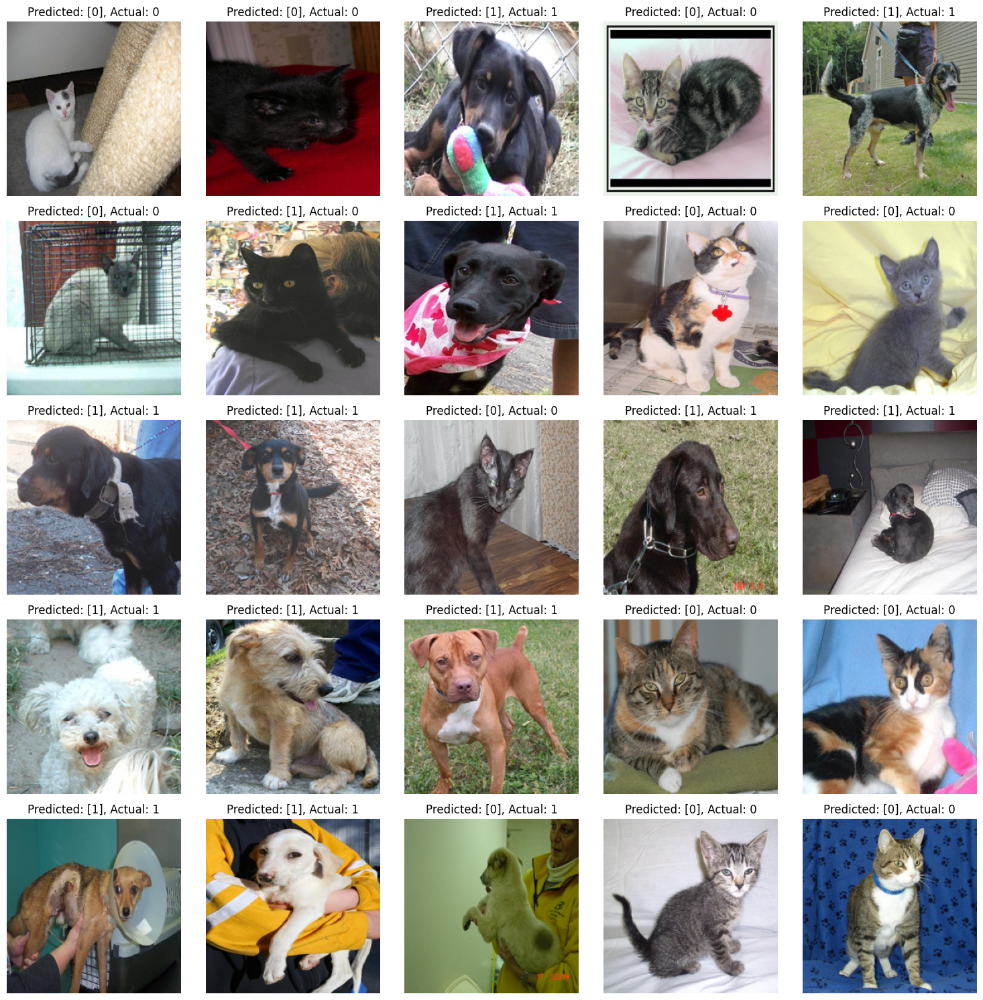

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Randomly pick 25 indices from X_test
random_indices = np.random.choice(len(X_test), 25, replace=False)

# Create a figure that's large enough for 25 subplots
plt.figure(figsize=(15, 15))

for i, idx in enumerate(random_indices):
    plt.subplot(5, 5, i + 1)  # 5 rows, 5 columns
    # 'Denormalize' if X_test is in [0,1]
    img_display = (X_test[idx] * 255).astype('uint8')
    plt.imshow(img_display)
    plt.title(f"Predicted: {predicted_labels[idx]}, Actual: {y_test[idx]}")
    plt.axis('off')

plt.tight_layout()
plt.show()


# Transfer Learning (Using Pretrained Models)

What is Transfer Learning?

Definition:
Transfer Learning leverages knowledge from a pre-trained model on a source task to
improve performance on a target task, reducing the need for large labeled datasets

The model we used: MobileNetV2

This model is lightweight CNN design, utilized for mobile and embedded vision applications. MobileNetV2 is a google developed model that showcases a good balance between accuracy and size.

## Pretrained Model

### Building and Training

We utilized the MobileNetV2 pre trained model. Within this model we remove the final classification layer from the pretrained model as we want to apply the model to our Cat's vs Dog's classification. We utilize the Imagenet dataset for the model to learn useful infromation such as edges, texture, ect.

Freezing of pretrained data is done because we want to keep the faetures already trained by the imagenet dataset in the model. This can also help with preventing overfitting in the model.

In [ ]:
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import MaxPooling2D,Flatten
#creating the pretrained model, with pretrained weights from the imagenet database. Removes the top classification layer of the model, and accept an img size of 224x224px with 3 colour channel's.
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze pretrained
base_model.trainable = False


x = base_model.output
x = tf.keras.layers.MaxPooling2D()(x)  # for more pooling
x = tf.keras.layers.Flatten()(x)       # collapses all spatial dims
predictions = tf.keras.layers.Dense(1, activation='sigmoid')(x)

model = tf.keras.Model(inputs=base_model.input, outputs=predictions)


# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Print the model summary
model.summary()


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1 (Conv2D)            │ (None, 112, 112, 32)   │            864 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bn_Conv1                  │ (None, 112, 112, 32)   │            128 │ Conv1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1_relu (ReLU)         │ (None, 112, 112, 32)   │              0 │ bn_Conv1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise   │ (None, 112, 112, 32)   │            288 │ Conv1_relu[0][0]       │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 112, 112, 32)   │            128 │ expanded_conv_depthwi… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 112, 112, 32)   │              0 │ expanded_conv_depthwi… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project     │ (None, 112, 112, 16)   │            512 │ expanded_conv_depthwi… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project_BN  │ (None, 112, 112, 16)   │             64 │ expanded_conv_project… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand (Conv2D)   │ (None, 112, 112, 96)   │          1,536 │ expanded_conv_project… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_BN         │ (None, 112, 112, 96)   │            384 │ block_1_expand[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_relu       │ (None, 112, 112, 96)   │              0 │ block_1_expand_BN[0][… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_pad               │ (None, 113, 113, 96)   │              0 │ block_1_expand_relu[0… │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_depthwise         │ (None, 56, 56, 96)     │            864 │ block_1_pad[0][0]      │
│ (DepthwiseConv2D)         │                        │                │                        │
├──────────────────────

 Total params: 2,269,505 (8.66 MB)

 Trainable params: 11,521 (45.00 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:
#Training the model
history = model.fit(
    X_train1, y_train1,
    validation_data=(X_val, y_val),
    epochs=10,
    batch_size=32
)

Epoch 1/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 37s 44ms/step - accuracy: 0.9430 - loss: 0.2378 - val_accuracy: 0.9780 - val_loss: 0.1121
Epoch 2/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 8s 15ms/step - accuracy: 0.9881 - loss: 0.0558 - val_accuracy: 0.9758 - val_loss: 0.1372
Epoch 3/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 8s 15ms/step - accuracy: 0.9905 - loss: 0.0388 - val_accuracy: 0.9747 - val_loss: 0.2092
Epoch 4/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - accuracy: 0.9911 - loss: 0.0490 - val_accuracy: 0.9787 - val_loss: 0.1607
Epoch 5/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 8s 15ms/step - accuracy: 0.9947 - loss: 0.0273 - val_accuracy: 0.9772 - val_loss: 0.2300
Epoch 6/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 8s 15ms/step - accuracy: 0.9970 - loss: 0.0118 - val_accuracy: 0.9700 - val_loss: 0.3021
Epoch 7/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - accuracy: 0.9957 - loss: 0.0230 - val_accuracy: 0.9765 - val_loss: 0.2339
Epoch 8/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 8s 15ms/step - accuracy: 0.9957 - loss: 0.0248 - val_acc

In [ ]:
# Testing the model
loss, accuracy = model.evaluate(X_test, y_test)

print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")

157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.9808 - loss: 0.2203
Test Loss: 0.2449
Test Accuracy: 0.9800


### Graph of Accuracy and Loss

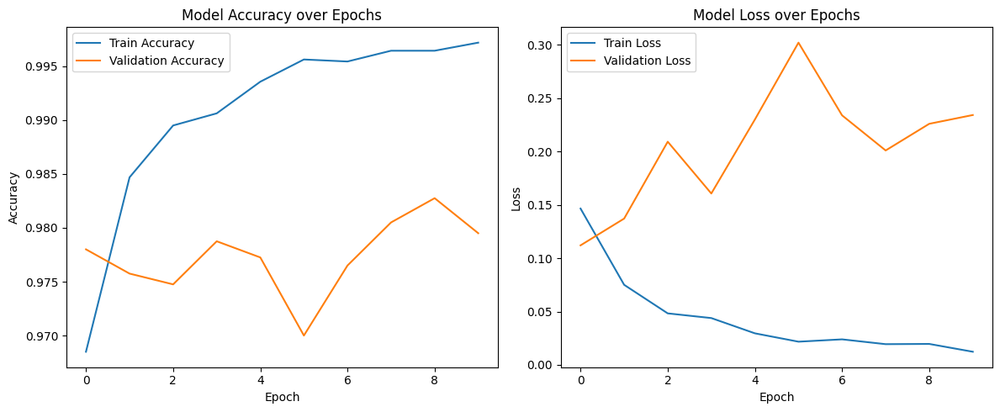

In [ ]:
import matplotlib.pyplot as plt

# Plot Training and Validation Accuracy
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='upper left')

# Plot Training and Validation Loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper left')

plt.tight_layout()
plt.show()


In [ ]:
predictions = model.predict(X_test)  # This returns probabilities
predicted_labels = (predictions > 0.5).astype("int32")  # Convert probabilities to 0 or 1

157/157 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step


### Confusion Matrix

From the confusion matrix we can see that the model does a really good job at predicting true values from the dataset given. It only has 56 false negatvies for cats, and from and 44 for dogs.

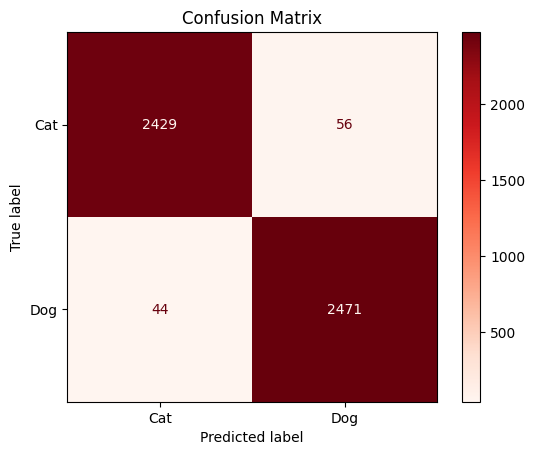

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

#Create the Confusion Matrix
cm = confusion_matrix(y_test, predicted_labels)

# Create the display object
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Cat", "Dog"])

# Plot the confusion matrix
disp.plot(cmap=plt.cm.Reds)
plt.title("Confusion Matrix")
plt.show()

### Classification Report

For all the metrics in the classification report we can see that there is a 98% Of all the images labelled as cats, 98% were truly cats and the same goes for dogs. The f1-score also indicates overall good performance for the precision and recall.

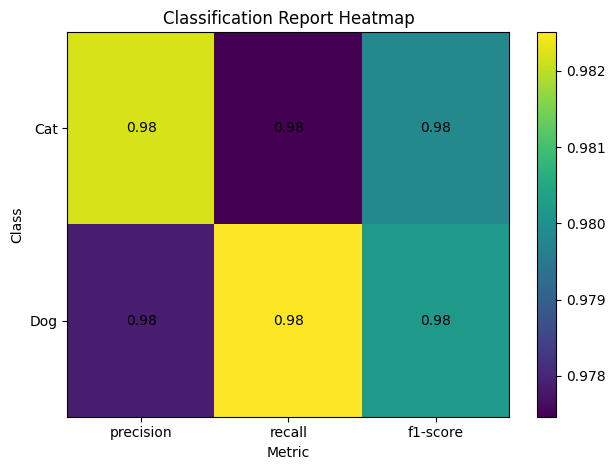

In [ ]:
from sklearn.metrics import classification_report
import pandas as pd
import matplotlib.pyplot as plt

report = classification_report(y_test, predicted_labels,
                               target_names=['Cat','Dog'],
                               output_dict=True)
df = pd.DataFrame(report).transpose()[['precision','recall','f1-score']].loc[['Cat','Dog']]

# Plot heatmap
fig, ax = plt.subplots()
im = ax.imshow(df.values, aspect='auto')            # default colormap

# Label axes
ax.set_xticks(range(len(df.columns)))
ax.set_xticklabels(df.columns)
ax.set_yticks(range(len(df.index)))
ax.set_yticklabels(df.index)

# Annotate each cell with its value
for i in range(df.shape[0]):
    for j in range(df.shape[1]):
        ax.text(j, i, f"{df.iloc[i, j]:.2f}",
                ha='center', va='center')

# Add colorbar and title
fig.colorbar(im, ax=ax)
plt.title("Classification Report Heatmap")
plt.xlabel("Metric")
plt.ylabel("Class")
plt.tight_layout()
plt.show()


### Testing the Model from a Sample of Testing Data

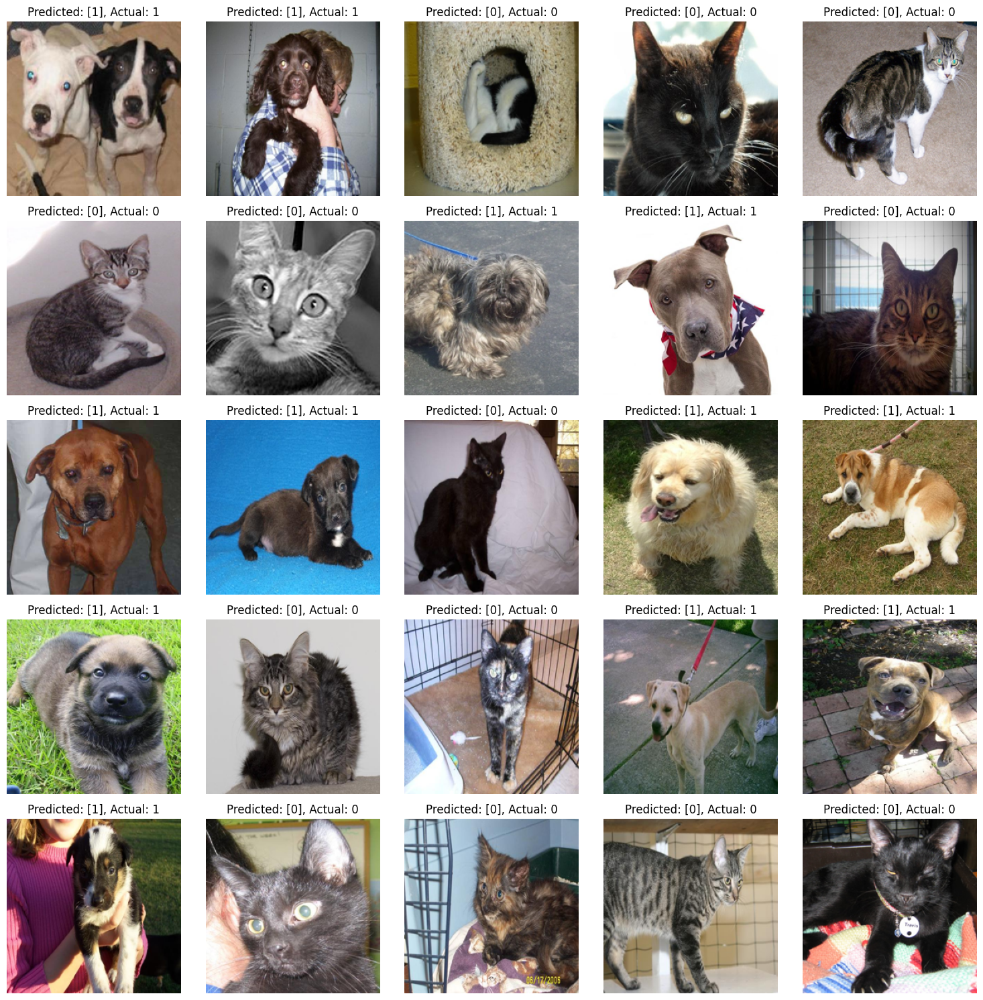

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Randomly pick 25 indices from X_test
random_indices = np.random.choice(len(X_test), 25, replace=False)

# Create a figure that's large enough for 25 subplots
plt.figure(figsize=(15, 15))

for i, idx in enumerate(random_indices):
    plt.subplot(5, 5, i + 1)  # 5 rows, 5 columns
    # 'Denormalize' if X_test is in [0,1]
    img_display = (X_test[idx] * 255).astype('uint8')
    plt.imshow(img_display)
    plt.title(f"Predicted: {predicted_labels[idx]}, Actual: {y_test[idx]}")
    plt.axis('off')

plt.tight_layout()
plt.show()


## Improved Pretrain Model

### Building and Testing

We utilized the MobileNetV2 pre trained model. Within this model we remove the final classification layer from the pretrained model as we want to apply the model to our Cat's vs Dog's classification. We utilize the Imagenet dataset for the model to learn useful infromation such as edges, texture, ect.

Freezing of pretrained data is done because we want to keep the faetures already trained by the imagenet dataset in the model. This can also help with preventing overfitting in the model.

In [ ]:
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import MaxPooling2D,Flatten
from keras.regularizers import l2

#creating the pretrained model, with pretrained weights from the imagenet database. Removes the top classification layer of the model, and accept an img size of 224x224px with 3 colour channel's.
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model
base_model.trainable = False


x = base_model.output
x = MaxPooling2D()(x)          # Optional extra pooling step
x = Flatten()(x)               # Flatten to 1D
predictions = Dense(1, activation='sigmoid')(x)  # Binary classification layer

model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Print the model summary
model.summary()


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1 (Conv2D)            │ (None, 112, 112, 32)   │            864 │ input_layer_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bn_Conv1                  │ (None, 112, 112, 32)   │            128 │ Conv1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1_relu (ReLU)         │ (None, 112, 112, 32)   │              0 │ bn_Conv1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise   │ (None, 112, 112, 32)   │            288 │ Conv1_relu[0][0]       │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 112, 112, 32)   │            128 │ expanded_conv_depthwi… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 112, 112, 32)   │              0 │ expanded_conv_depthwi… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project     │ (None, 112, 112, 16)   │            512 │ expanded_conv_depthwi… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project_BN  │ (None, 112, 112, 16)   │             64 │ expanded_conv_project… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand (Conv2D)   │ (None, 112, 112, 96)   │          1,536 │ expanded_conv_project… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_BN         │ (None, 112, 112, 96)   │            384 │ block_1_expand[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_relu       │ (None, 112, 112, 96)   │              0 │ block_1_expand_BN[0][… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_pad               │ (None, 113, 113, 96)   │              0 │ block_1_expand_relu[0… │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_depthwise         │ (None, 56, 56, 96)     │            864 │ block_1_pad[0][0]      │
│ (DepthwiseConv2D)         │                        │                │                        │
├──────────────────────

 Total params: 2,269,505 (8.66 MB)

 Trainable params: 11,521 (45.00 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
# data augmentation making aritficial images
datagen = ImageDataGenerator(
    rotation_range=5,
    width_shift_range=0.05,
    height_shift_range=0.05,
    horizontal_flip=True,
    zoom_range=0.05
)


In [ ]:
#Training the dataset
history = model.fit(
    datagen.flow(X_train1, y_train1, batch_size=32),
    validation_data=(X_val, y_val),
    epochs=10,
)

Epoch 1/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 169s 325ms/step - accuracy: 0.9467 - loss: 0.2025 - val_accuracy: 0.9643 - val_loss: 0.2692
Epoch 2/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 150s 300ms/step - accuracy: 0.9773 - loss: 0.1307 - val_accuracy: 0.9795 - val_loss: 0.1326
Epoch 3/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 150s 301ms/step - accuracy: 0.9817 - loss: 0.1017 - val_accuracy: 0.9747 - val_loss: 0.2036
Epoch 4/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 150s 300ms/step - accuracy: 0.9815 - loss: 0.1225 - val_accuracy: 0.9808 - val_loss: 0.1741
Epoch 5/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 151s 302ms/step - accuracy: 0.9878 - loss: 0.0798 - val_accuracy: 0.9700 - val_loss: 0.2932
Epoch 6/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 150s 300ms/step - accuracy: 0.9853 - loss: 0.0946 - val_accuracy: 0.9780 - val_loss: 0.1995
Epoch 7/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 151s 301ms/step - accuracy: 0.9862 - loss: 0.0982 - val_accuracy: 0.9795 - val_loss: 0.1961
Epoch 8/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 150s 300ms/step - accuracy: 0.9886 -

### Graph of Accuracy and Loss

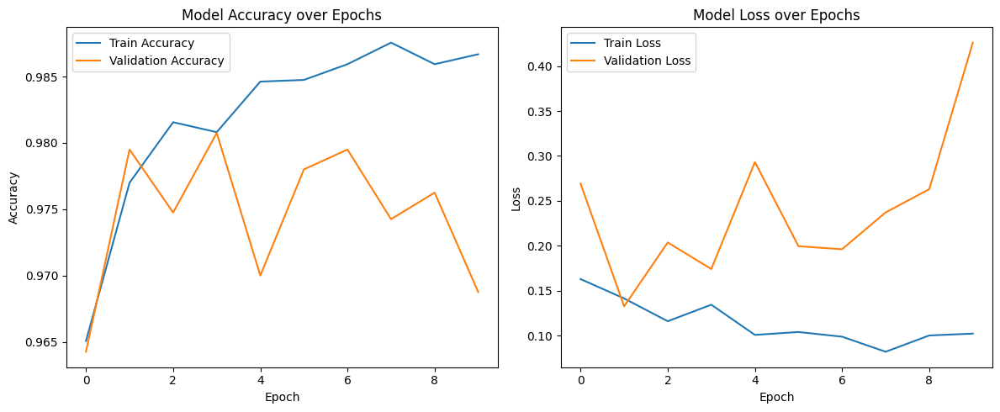

In [ ]:
import matplotlib.pyplot as plt

# Plot Training and Validation Accuracy
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='upper left')

# Plot Training and Validation Loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper left')

plt.tight_layout()
plt.show()


### Confusion Matrix

From the confusion matrix we can see that the new model still does a really good job at predicting true values from the dataset given. It only has 158 false negatvies for cats, and from and 396 for dogs.

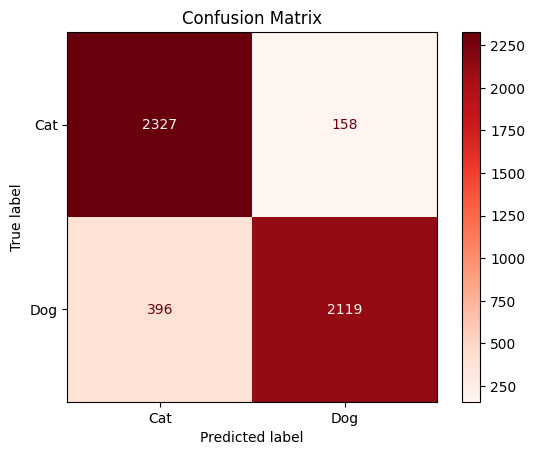

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

#creating the Confusion Matrix
cm = confusion_matrix(y_test, predicted_labels)

# Create the display object.
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Cat", "Dog"])

# Plot the confusion matrix
disp.plot(cmap=plt.cm.Reds)
plt.title("Confusion Matrix")
plt.show()

### Classification Report

Based on the classification report we can see that of all the images labelled as cats, 85%% were truly cats. This value is lower than the old model. The same goes for dogs, . The f1-score also indicates overall good performance for the precision and recall.

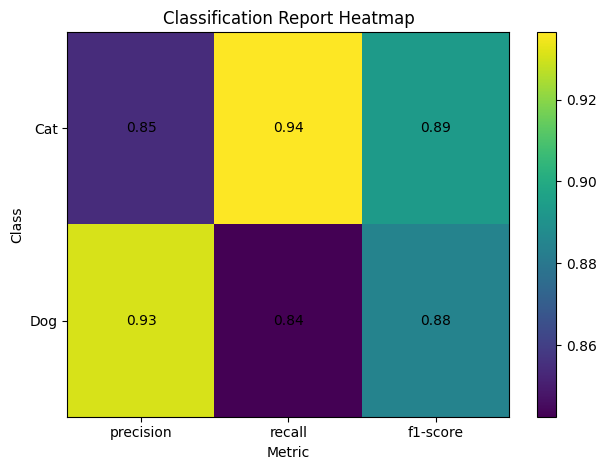

In [ ]:
from sklearn.metrics import classification_report
import pandas as pd
import matplotlib.pyplot as plt

# Build report DataFrame
report = classification_report(y_test, predicted_labels,
                               target_names=['Cat','Dog'],
                               output_dict=True)
df = pd.DataFrame(report).transpose()[['precision','recall','f1-score']].loc[['Cat','Dog']]

# Plot heatmap
fig, ax = plt.subplots()
im = ax.imshow(df.values, aspect='auto')            # default colormap

# Label axes
ax.set_xticks(range(len(df.columns)))
ax.set_xticklabels(df.columns)
ax.set_yticks(range(len(df.index)))
ax.set_yticklabels(df.index)

# Annotate each cell with its value
for i in range(df.shape[0]):
    for j in range(df.shape[1]):
        ax.text(j, i, f"{df.iloc[i, j]:.2f}",
                ha='center', va='center')

# Add colorbar and title
fig.colorbar(im, ax=ax)
plt.title("Classification Report Heatmap")
plt.xlabel("Metric")
plt.ylabel("Class")
plt.tight_layout()
plt.show()

### Testing the Model from a Sample of Testing Data

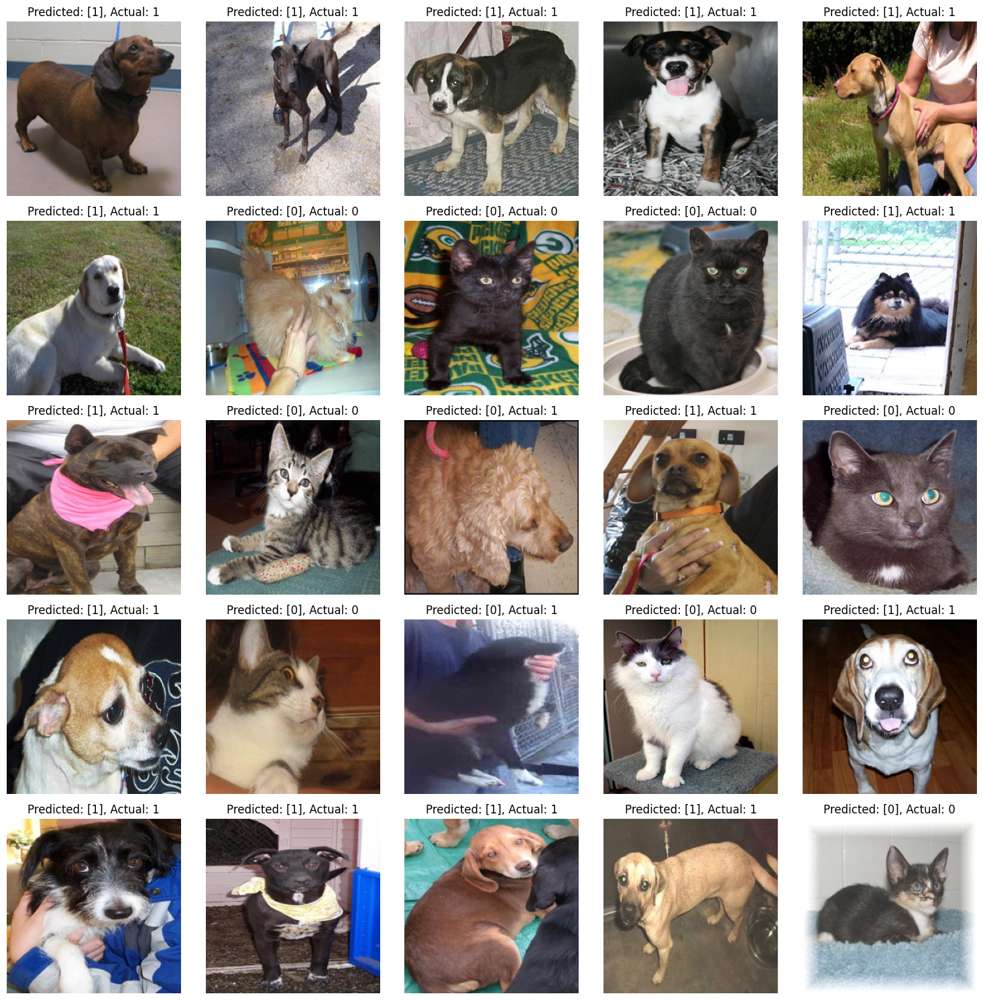

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Randomly pick 25 indices from X_test
random_indices = np.random.choice(len(X_test), 25, replace=False)

# Create a figure that's large enough for 25 subplots
plt.figure(figsize=(15, 15))

for i, idx in enumerate(random_indices):
    plt.subplot(5, 5, i + 1)  # 5 rows, 5 columns
    # 'Denormalize' if X_test is in [0,1]
    img_display = (X_test[idx] * 255).astype('uint8')
    plt.imshow(img_display)
    plt.title(f"Predicted: {predicted_labels[idx]}, Actual: {y_test[idx]}")
    plt.axis('off')

plt.tight_layout()
plt.show()


# Conclusion

In this project, we explored how deep learning, specifically Convolutional Neural Networks (CNNs), can effectively classify images of cats and dogs. We began with a simple CNN and achieved around 85% accuracy, but noticed signs of overfitting. To address this, we introduced data augmentation (random flips, shifts, zooms) and additional dropout layers, which yielded a more balanced model with improved accuracy (approximately 89%) and reduced overfitting.

Finally, we leveraged transfer learning by using MobileNetV2 pretrained on ImageNet. By freezing the base layers and adding a custom classification head, we benefited from the robust feature extraction of a large-scale pretrained model, further stabilizing training and often achieving competitive accuracy. Overall, these experiments highlight how data augmentation, dropout, and transfer learning can significantly improve performance and generalization when building deep learning models for image classification.

